In [2]:
import pandas as pd
import boto3
import logging
import os
from io import StringIO
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

pd.set_option("display.max_columns", 50)

In [3]:
aws_access_key_id = os.getenv("AWS_ACCESS_KEY")
aws_secret_key = os.getenv("AWS_SECRET_KEY")

In [4]:
# Enable boto3 debug logging
boto3.set_stream_logger(name='boto3', level=logging.DEBUG)

s3 = boto3.client(
    's3',
    aws_access_key_id=aws_access_key_id,
    aws_secret_access_key=aws_secret_key
)

# Try to access a file (or use any other S3 operation)
try:
    response = s3.list_objects_v2(Bucket='cubix-chicago-taxi-sp', Prefix='transformed_data/payment_type/')
    print(response)
except Exception as e:
    print(f"Error: {e}")

{'ResponseMetadata': {'RequestId': '1ZZR1FTW99FNJ822', 'HostId': 'DePe/v6Adb2zegPnF78p5VsljweHjDHqtuU6ylqdVdiA6Ot1JEdt01gD+1DkcMqsmqn38tp5an+2FPE0HzctWXxm2cnKe2EXNues9kZVk7c=', 'HTTPStatusCode': 200, 'HTTPHeaders': {'x-amz-id-2': 'DePe/v6Adb2zegPnF78p5VsljweHjDHqtuU6ylqdVdiA6Ot1JEdt01gD+1DkcMqsmqn38tp5an+2FPE0HzctWXxm2cnKe2EXNues9kZVk7c=', 'x-amz-request-id': '1ZZR1FTW99FNJ822', 'date': 'Tue, 01 Apr 2025 09:47:59 GMT', 'x-amz-bucket-region': 'us-east-1', 'content-type': 'application/xml', 'transfer-encoding': 'chunked', 'server': 'AmazonS3'}, 'RetryAttempts': 0}, 'IsTruncated': False, 'Contents': [{'Key': 'transformed_data/payment_type/', 'LastModified': datetime.datetime(2025, 3, 13, 7, 56, 19, tzinfo=tzlocal()), 'ETag': '"d41d8cd98f00b204e9800998ecf8427e"', 'ChecksumAlgorithm': ['CRC64NVME'], 'ChecksumType': 'FULL_OBJECT', 'Size': 0, 'StorageClass': 'STANDARD'}, {'Key': 'transformed_data/payment_type/payment_type_master.csv', 'LastModified': datetime.datetime(2025, 4, 1, 8, 8, 58, tz

In [5]:
def read_csv_from_s3(bucket: str, path: str, filename: str) -> pd.DataFrame:
    """
    Reads a CSV file from an S3 bucket and loads it into a Pandas DataFrame.

    Args:
        bucket (str): The name of the S3 bucket.
        key (str): The S3 key (folder path) where the file is located.
        filename (str): The name of the CSV file to be read.

    Returns:
        pd.DataFrame: A Pandas DataFrame containing the data from the CSV file.

    Note:
        This function assumes that the CSV file is UTF-8 encoded.
    """
    s3 = boto3.client(
    's3',
    aws_access_key_id=aws_access_key_id,
    aws_secret_access_key=aws_secret_key
    )
    full_path = f"{path}{filename}"
    object = s3.get_object(Bucket=bucket, Key=full_path)
    object = object['Body'].read().decode('utf-8')
    output_df = pd.read_csv(StringIO(object))
    return output_df

In [6]:
bucket = "cubix-chicago-taxi-sp"

community_area_path = "transformed_data/community_areas/"
company_path = "transformed_data/company/"
date_path = "transformed_data/date/"
payment_type_path = "transformed_data/payment_type/"
taxi_data_path = "transformed_data/taxi_data/"
weather_path = "transformed_data/weather/"

In [7]:
community_areas = read_csv_from_s3(bucket, community_area_path, "community_areas_master.csv")
company = read_csv_from_s3(bucket, company_path, "company_master.csv")
date = read_csv_from_s3(bucket, date_path, "date_dimensions.csv")
payment_type = read_csv_from_s3(bucket = bucket, path = payment_type_path, filename = "payment_type_master.csv" )

In [8]:
trips_list = []
weather_list = []

In [9]:
# Taxi data
for file in s3.list_objects(Bucket=bucket, Prefix = taxi_data_path)['Contents']:
    taxi_trips_key = file['Key']

    if taxi_trips_key.split('/')[-1].strip() != '':
        if taxi_trips_key.split('.')[1] == 'csv':
            filename = taxi_trips_key.split('/')[-1]
            trip = read_csv_from_s3(bucket, taxi_data_path, filename)
            trips_list.append(trip)
            print(f"{filename} has been added.")

taxi_2025-01-13.csv has been added.
taxi_2025-01-14.csv has been added.
taxi_2025-01-15.csv has been added.
taxi_2025-01-16.csv has been added.
taxi_2025-01-17.csv has been added.
taxi_2025-01-18.csv has been added.
taxi_2025-01-19.csv has been added.
taxi_2025-01-20.csv has been added.
taxi_2025-01-21.csv has been added.
taxi_2025-01-22.csv has been added.
taxi_2025-01-23.csv has been added.
taxi_2025-01-24.csv has been added.
taxi_2025-01-25.csv has been added.
taxi_2025-01-26.csv has been added.
taxi_2025-01-27.csv has been added.
taxi_2025-01-28.csv has been added.
taxi_2025-01-29.csv has been added.
taxi_2025-01-30.csv has been added.
taxi_2025-01-31.csv has been added.
taxi_2025-02-01.csv has been added.


In [10]:
trips= pd.concat(trips_list, ignore_index= True)

In [11]:
trips.head()

,trip_id,taxi_id,trip_start_timestamp,trip_end_timestamp,trip_seconds,trip_miles,pickup_community_area_id,dropoff_community_area_id,fare,tips,tolls,extras,trip_total,pickup_centroid_latitude,pickup_centroid_longitude,dropoff_centroid_latitude,dropoff_centroid_longitude,datetime_for_weather,payment_type_id,company_id
0,09e49c4101f6df88e34156b4615654f9c052ed51,4f7fd7c1ea16af4b1aaab270f6b0d7ddb68e9edd79b1b5...,2025-01-13T23:45:00.000,2025-01-13T23:45:00.000,374,2.96,15,16,10.25,0.0,0.0,0.0,10.25,41.954028,-87.763399,41.953582,-87.723452,2025-01-13 23:00:00,2,4
1,f9aeb0af6062f49b97b04738c4fcd3be8f30d30e,6c87f1d023a9d7146ae81b6aa4648bf98cec52cceb9f08...,2025-01-13T23:45:00.000,2025-01-14T00:00:00.000,960,7.40,56,60,20.75,4.0,0.0,4.0,28.75,41.792592,-87.769615,41.836150,-87.648788,2025-01-13 23:00:00,1,1
2,f9315e5df122d02ba882f0f3f685b5111cd1fb44,f20c9c5845dab1e51799b959d378c102763d4b31d738da...,2025-01-13T23:45:00.000,2025-01-14T00:00:00.000,927,11.55,32,44,30.00,0.0,0.0,0.0,30.00,41.878866,-87.625192,41.740206,-87.615970,2025-01-13 23:00:00,5,2
3,ef22008f76848cbb6b776a6e0d20c24285e4c9e9,01480513a7f6f4664d6cc4c41ff3043ae6ecbc8cb17404...,2025-01-13T23:45:00.000,2025-01-14T00:00:00.000,504,1.31,6,6,7.25,0.0,0.0,0.0,7.25,41.944227,-87.655998,41.944227,-87.655998,2025-01-13 23:00:00,2,12
4,ec5fa3c13128ca2bc3999d45d9363cf0d4418ce5,3b823c97b6350b7ba050457894c8ed25accf5f417ca202...,2025-01-13T23:45:00.000,2025-01-14T00:15:00.000,1287,16.60,76,8,55.00,8.8,0.0,4.0,68.30,41.980264,-87.913625,41.899602,-87.633308,2025-01-13 23:00:00,1,3


In [12]:
# Weather data
for file in s3.list_objects(Bucket=bucket, Prefix = weather_path)['Contents']:
    weather_key = file['Key']

    if weather_key.split('/')[-1].strip() != '':
        if weather_key.split('.')[1] == 'csv':

            filename = weather_key.split('/')[-1]
            weather = read_csv_from_s3(bucket, weather_path, filename)
            weather_list.append(weather)
            print(f"{filename} has been added.")

weather_2025-01-13.csv has been added.
weather_2025-01-14.csv has been added.
weather_2025-01-15.csv has been added.
weather_2025-01-16.csv has been added.
weather_2025-01-17.csv has been added.
weather_2025-01-18.csv has been added.
weather_2025-01-19.csv has been added.
weather_2025-01-20.csv has been added.
weather_2025-01-21.csv has been added.
weather_2025-01-22.csv has been added.
weather_2025-01-23.csv has been added.
weather_2025-01-24.csv has been added.
weather_2025-01-25.csv has been added.
weather_2025-01-26.csv has been added.
weather_2025-01-27.csv has been added.
weather_2025-01-28.csv has been added.
weather_2025-01-29.csv has been added.
weather_2025-01-30.csv has been added.
weather_2025-01-31.csv has been added.
weather_2025-02-01.csv has been added.


In [13]:
weather= pd.concat(weather_list, ignore_index= True)

In [14]:
trips_full = pd.merge(trips, weather, left_on="datetime_for_weather", right_on= "datetime", how= "inner")
trips_full = trips_full.drop(columns= ["datetime"])

In [15]:
trips_full = pd.merge(trips_full, company, left_on = "company_id", right_on= "company_id", how = "inner")
trips_full = trips_full.drop(columns= ["company_id"])

In [16]:
trips_full = pd.merge(trips_full, payment_type, left_on = "payment_type_id", right_on= "payment_type_id", how = "inner")
trips_full = trips_full.drop(columns= ["payment_type_id"])

In [17]:
trips_full = pd.merge(trips_full, community_areas, left_on = "pickup_community_area_id", right_on= "area_code", how = "inner")
trips_full = trips_full.drop(columns= ["pickup_community_area_id"])
trips_full.rename(columns={"community_name": "pickup_community_area_name"}, inplace=True)

In [18]:
trips_full = pd.merge(trips_full, community_areas, left_on = "dropoff_community_area_id", right_on= "area_code", how = "inner")
trips_full = trips_full.drop(columns= ["dropoff_community_area_id"])
trips_full.rename(columns={"community_name": "dropoff_community_area_name"}, inplace=True)

In [19]:
trips_full = trips_full.drop(columns= ["area_code_x", "area_code_y"])

In [20]:
date["date"] = pd.to_datetime(date["date"])

In [21]:
trips_full["trip_start_timestamp"] = pd.to_datetime(trips_full["trip_start_timestamp"])
trips_full["trip_start_date"] = trips_full["trip_start_timestamp"].dt.date

In [22]:
trips_full["trip_start_date"]= pd.to_datetime(trips_full["trip_start_date"])

In [23]:
trips_full = pd.merge(trips_full, date, left_on = "trip_start_date", right_on= "date", how = "inner")

In [24]:
trips_full = trips_full.drop(columns=["date"])

In [25]:
trips_full.head()

,trip_id,taxi_id,trip_start_timestamp,trip_end_timestamp,trip_seconds,trip_miles,fare,tips,tolls,extras,trip_total,pickup_centroid_latitude,pickup_centroid_longitude,dropoff_centroid_latitude,dropoff_centroid_longitude,datetime_for_weather,temperature,wind_speed,rain,precipitation,company,payment_type,pickup_community_area_name,dropoff_community_area_name,trip_start_date,year,month,day,day_of_week,is_weekend
0,09e49c4101f6df88e34156b4615654f9c052ed51,4f7fd7c1ea16af4b1aaab270f6b0d7ddb68e9edd79b1b5...,2025-01-13 23:45:00,2025-01-13T23:45:00.000,374,2.96,10.25,0.0,0.0,0.0,10.25,41.954028,-87.763399,41.953582,-87.723452,2025-01-13 23:00:00,-9.3,12.9,0.0,0.0,Chicago Independents,Cash,Portage Park,Irving Park,2025-01-13,2025,1,13,1,False
1,f9aeb0af6062f49b97b04738c4fcd3be8f30d30e,6c87f1d023a9d7146ae81b6aa4648bf98cec52cceb9f08...,2025-01-13 23:45:00,2025-01-14T00:00:00.000,960,7.40,20.75,4.0,0.0,4.0,28.75,41.792592,-87.769615,41.836150,-87.648788,2025-01-13 23:00:00,-9.3,12.9,0.0,0.0,Taxi Affiliation Services,Credit Card,Garfield Ridge,Bridgeport,2025-01-13,2025,1,13,1,False
2,f9315e5df122d02ba882f0f3f685b5111cd1fb44,f20c9c5845dab1e51799b959d378c102763d4b31d738da...,2025-01-13 23:45:00,2025-01-14T00:00:00.000,927,11.55,30.00,0.0,0.0,0.0,30.00,41.878866,-87.625192,41.740206,-87.615970,2025-01-13 23:00:00,-9.3,12.9,0.0,0.0,Flash Cab,Prcard,Loop,Chatham,2025-01-13,2025,1,13,1,False
3,ef22008f76848cbb6b776a6e0d20c24285e4c9e9,01480513a7f6f4664d6cc4c41ff3043ae6ecbc8cb17404...,2025-01-13 23:45:00,2025-01-14T00:00:00.000,504,1.31,7.25,0.0,0.0,0.0,7.25,41.944227,-87.655998,41.944227,-87.655998,2025-01-13 23:00:00,-9.3,12.9,0.0,0.0,Blue Ribbon Taxi Association,Cash,Lake View,Lake View,2025-01-13,2025,1,13,1,False
4,ec5fa3c13128ca2bc3999d45d9363cf0d4418ce5,3b823c97b6350b7ba050457894c8ed25accf5f417ca202...,2025-01-13 23:45:00,2025-01-14T00:15:00.000,1287,16.60,55.00,8.8,0.0,4.0,68.30,41.980264,-87.913625,41.899602,-87.633308,2025-01-13 23:00:00,-9.3,12.9,0.0,0.0,Sun Taxi,Credit Card,O'Hare,Near North Side,2025-01-13,2025,1,13,1,False


#Visualisations

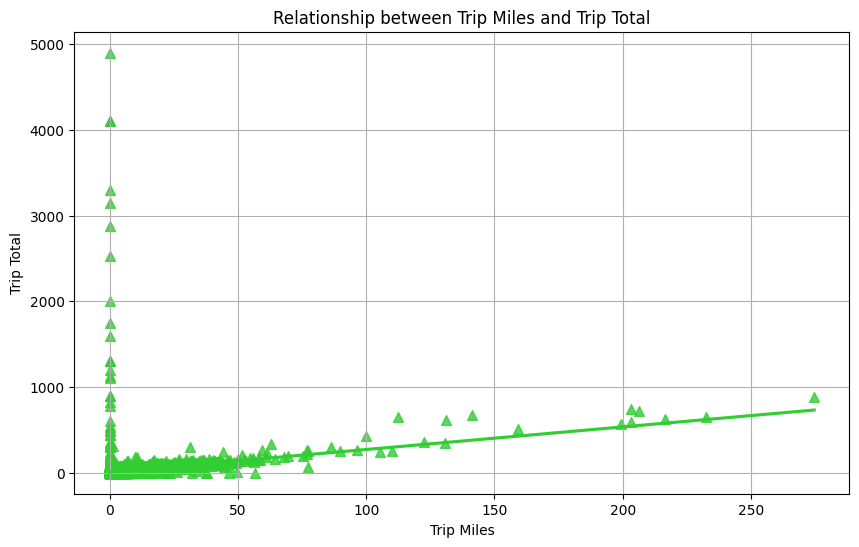

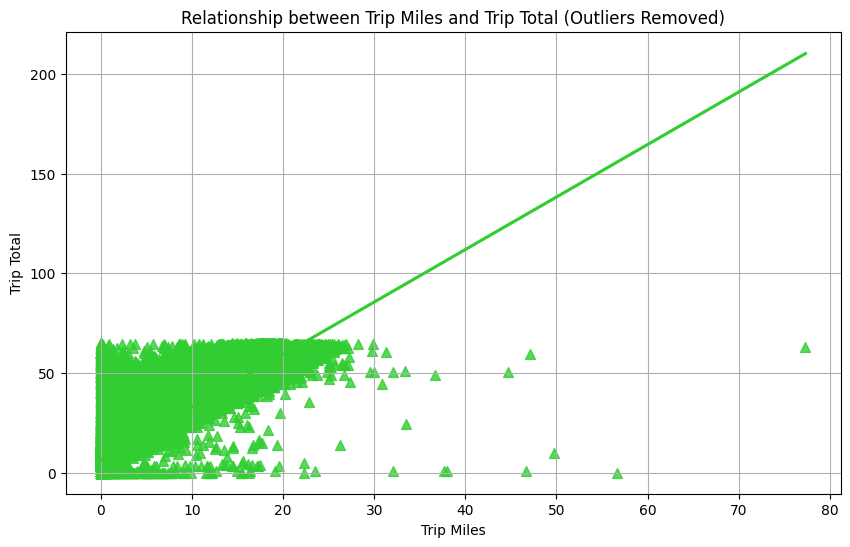

In [26]:
plt.figure(figsize=(10, 6))
sns.regplot(x='trip_miles', y='trip_total', data=trips_full, marker='^', color='limegreen', scatter_kws={'s': 50})
plt.xlabel('Trip Miles')
plt.ylabel('Trip Total')
plt.title('Relationship between Trip Miles and Trip Total')
plt.grid(True)

# Remove outliers
# Calculate the first quartile (Q1) and third quartile (Q3)
Q1 = trips_full['trip_total'].quantile(0.25)
Q3 = trips_full['trip_total'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Filter the DataFrame to remove outliers
trips_full_filtered = trips_full[(trips_full['trip_total'] >= lower_bound) & (trips_full['trip_total'] <= upper_bound)]

# Create the plot without outliers
plt.figure(figsize=(10, 6))
sns.regplot(x='trip_miles', y='trip_total', data=trips_full_filtered, marker='^', color='limegreen', scatter_kws={'s': 50})
plt.xlabel('Trip Miles')
plt.ylabel('Trip Total')
plt.title('Relationship between Trip Miles and Trip Total (Outliers Removed)')
plt.grid(True)
plt.show()


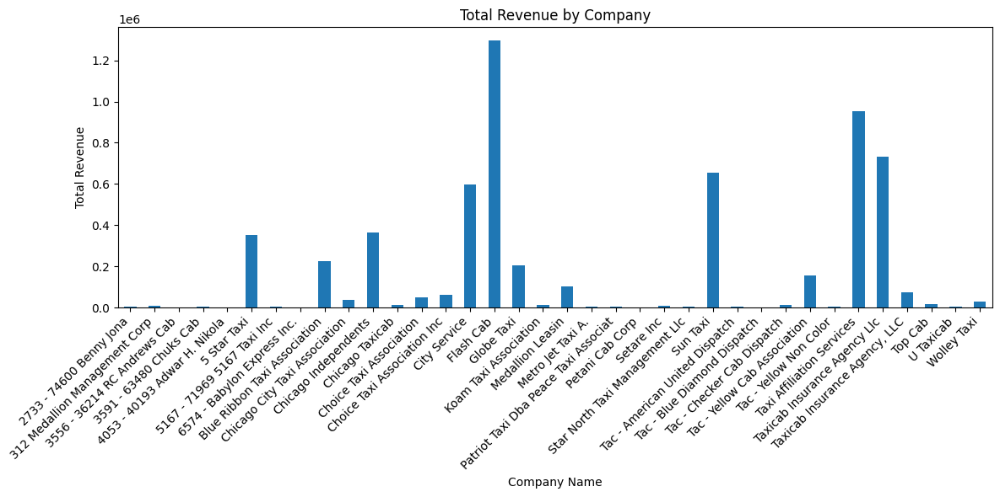

In [27]:
# Calculate revenue by company
revenue_by_company = trips_full.groupby('company')['trip_total'].sum()

# create bar chart
plt.figure(figsize=(12, 6))
revenue_by_company.plot(kind='bar')
plt.title('Total Revenue by Company')
plt.xlabel('Company Name')
plt.ylabel('Total Revenue')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [28]:
# Group trips by company and sum fare, tips, tolls, and extras
grouped_trips = trips_full.groupby('company').agg({'fare': 'sum', 'tips': 'sum', 'tolls': 'sum', 'extras': 'sum'}).reset_index()

# Create the stacked column chart using Plotly
fig = go.Figure()

fig.add_trace(go.Bar(
    x=grouped_trips['company'],
    y=grouped_trips['fare'],
    name='Fare',
    marker_color='rgb(55, 83, 109)'
))

fig.add_trace(go.Bar(
    x=grouped_trips['company'],
    y=grouped_trips['tips'],
    name='Tips',
    marker_color='rgb(26, 118, 255)'
))

fig.add_trace(go.Bar(
    x=grouped_trips['company'],
    y=grouped_trips['tolls'],
    name='Tolls',
    marker_color='rgb(171, 50, 96)'
))

fig.add_trace(go.Bar(
    x=grouped_trips['company'],
    y=grouped_trips['extras'],
    name='Extras',
    marker_color='rgb(255, 217, 102)'
))

fig.update_layout(barmode='stack', title='Trip Costs by Company', xaxis_title='Company', yaxis_title='Total Amount')
fig.show()


<ipython-input-29-0c6dec90435e>:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



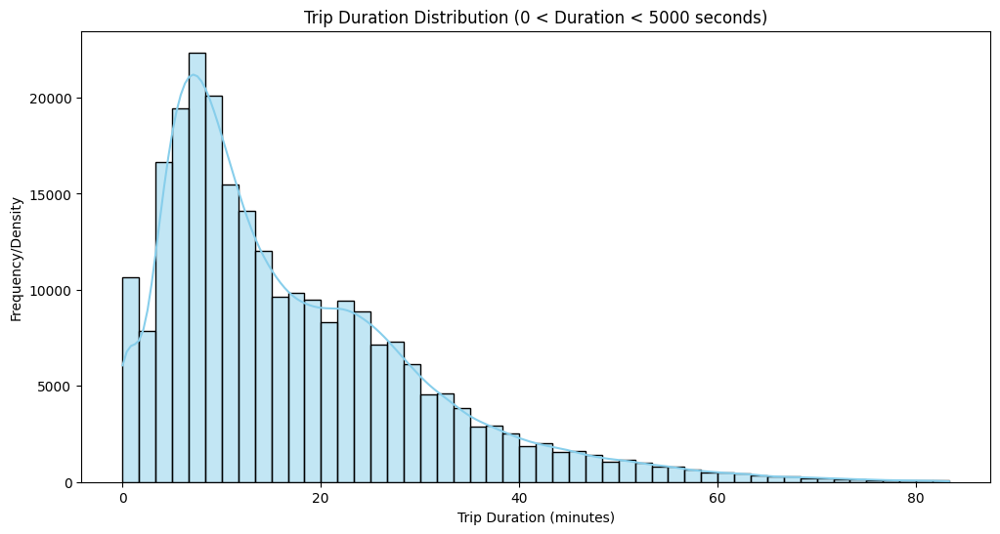

In [29]:
# Filter trips with duration between 0 and 5000 seconds
filtered_trips = trips_full[(trips_full['trip_seconds'] > 0) & (trips_full['trip_seconds'] < 5000)]

# Convert trip duration from seconds to minutes
filtered_trips['trip_minutes'] = filtered_trips['trip_seconds'] / 60

# Create the histogram or KDE plot in minutes
plt.figure(figsize=(12, 6))
sns.histplot(filtered_trips['trip_minutes'], kde=True, color='skyblue', bins=50)
plt.title('Trip Duration Distribution (0 < Duration < 5000 seconds)')
plt.xlabel('Trip Duration (minutes)')  # Change x-axis label to minutes
plt.ylabel('Frequency/Density')
plt.show()


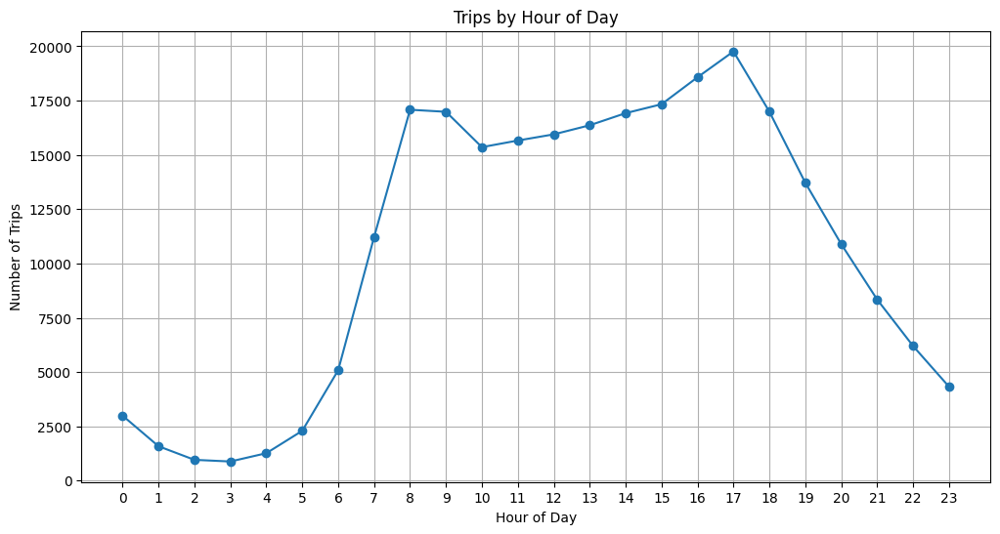

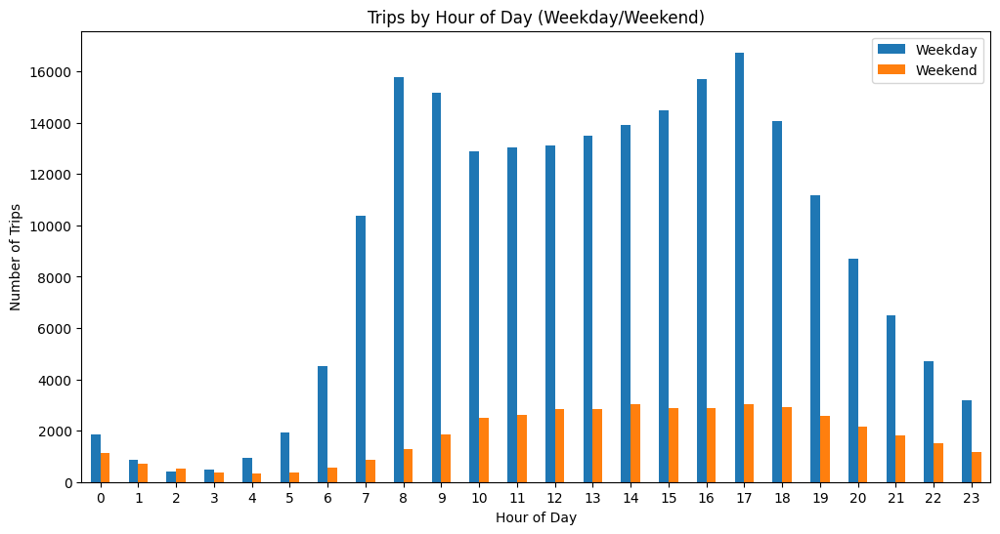

In [30]:
# Extract the hour of the day
trips_full['hour_of_day'] = trips_full['trip_start_timestamp'].dt.hour

# Group by hour of day and count trips
hourly_trips = trips_full.groupby('hour_of_day')['trip_id'].count()

# Create the line plot
plt.figure(figsize=(12, 6))
plt.plot(hourly_trips.index, hourly_trips.values, marker='o')
plt.title('Trips by Hour of Day')
plt.xlabel('Hour of Day')
plt.ylabel('Number of Trips')
plt.xticks(range(24))
plt.grid(True)
plt.show()

# Group by hour and weekend status, count trips
hourly_trips_weekend = trips_full.groupby(['hour_of_day', 'is_weekend'])['trip_id'].count().unstack()

#Plot
hourly_trips_weekend.plot(kind='bar', figsize=(12, 6))
plt.title('Trips by Hour of Day (Weekday/Weekend)')
plt.xlabel('Hour of Day')
plt.ylabel('Number of Trips')
plt.xticks(rotation=0)
plt.legend(['Weekday', 'Weekend'])
plt.show()

In [31]:
# Create the heatmap
fig = px.density_mapbox(trips_full, lat='pickup_centroid_latitude', lon='pickup_centroid_longitude', z='trip_total', radius=10,
                        center=dict(lat=41.8781, lon=-87.6298), zoom=9,
                        mapbox_style="carto-positron", title='Pickup Density Heatmap')
fig.show()

fig = px.density_mapbox(trips_full, lat='dropoff_centroid_latitude', lon='dropoff_centroid_longitude', z='trip_total', radius=10,
                        center=dict(lat=41.8781, lon=-87.6298), zoom=9,
                        mapbox_style="carto-positron", title='Dropoff Density Heatmap')
fig.show()


In [32]:
# Calculate the distribution of payment types
payment_type_counts = trips_full['payment_type'].value_counts()

# Create the pie chart using Plotly Express
fig = px.pie(payment_type_counts, values=payment_type_counts.values, names=payment_type_counts.index,
             title='Payment Types', hole=0.3, color_discrete_sequence=px.colors.qualitative.Pastel)
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.update_layout(
    width=1000,
    height=1000,
    title={
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})
fig.show()

In [33]:
fig = px.sunburst(trips_full, path=['company', 'payment_type'], title='Payment Types by Companies')
fig.update_layout(
    title={
        'x':0.5,
        'xanchor': 'center'
    },
    width=1000,
    height=1000
)
fig.show()

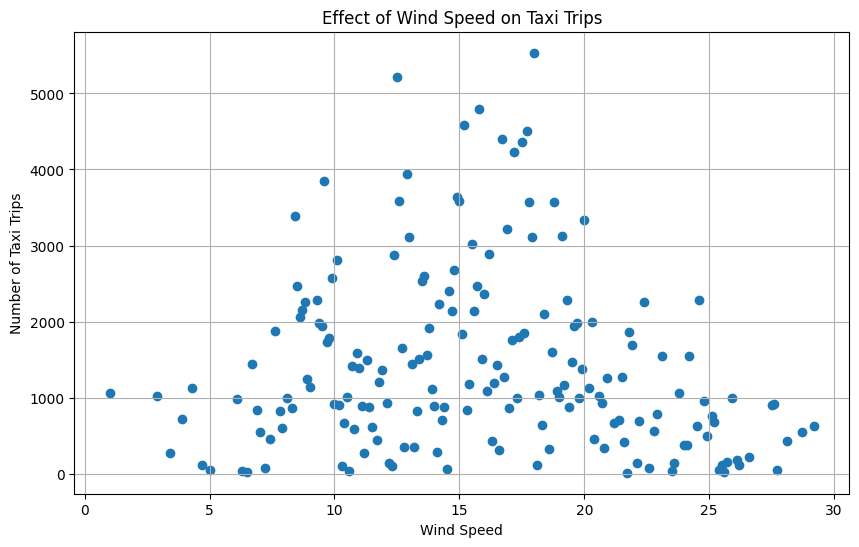

In [34]:
# Group data by wind speed and count the number of trips
wind_speed_trips = trips_full.groupby('wind_speed')['trip_id'].count().reset_index()

# Create the scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(wind_speed_trips['wind_speed'], wind_speed_trips['trip_id'])
plt.xlabel('Wind Speed')
plt.ylabel('Number of Taxi Trips')
plt.title('Effect of Wind Speed on Taxi Trips')
plt.grid(True)
plt.show()


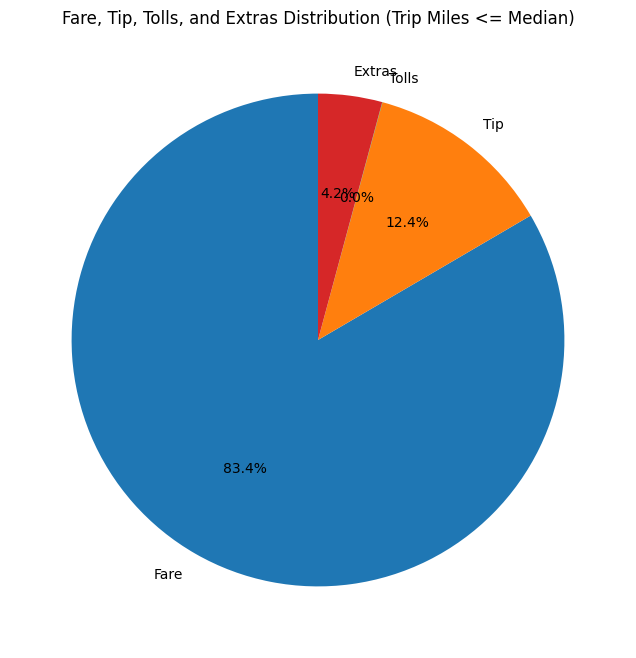

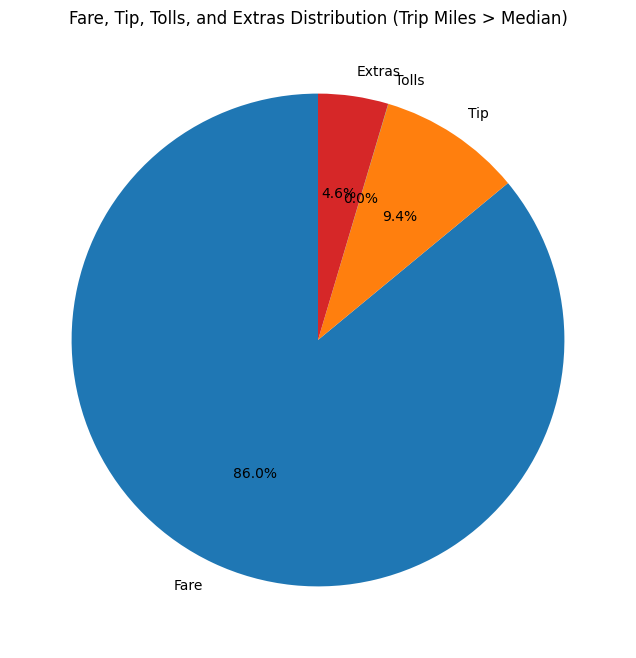

In [35]:
# Group trips into two groups based on trip_miles
median_trip_miles = trips_full['trip_miles'].median()
group1 = trips_full[trips_full['trip_miles'] <= median_trip_miles]
group2 = trips_full[trips_full['trip_miles'] > median_trip_miles]

# Function to create pie charts
def create_pie_chart(df, title):
    fare_sum = df['fare'].sum()
    tip_sum = df['tips'].sum()
    tolls_sum = df['tolls'].sum()
    extras_sum = df['extras'].sum()

    labels = ['Fare', 'Tip', 'Tolls', 'Extras']
    sizes = [fare_sum, tip_sum, tolls_sum, extras_sum]

    plt.figure(figsize=(8, 8))
    plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90)
    plt.title(title)
    plt.show()

# Create pie charts for each group
create_pie_chart(group1, 'Fare, Tip, Tolls, and Extras Distribution (Trip Miles <= Median)')
create_pie_chart(group2, 'Fare, Tip, Tolls, and Extras Distribution (Trip Miles > Median)')
